# Spotify Recommender System

## Dicionário dos dados

[Spotify API](https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features)

* `Acousticness/Acústica:` Variável numérica, medida de confiança de 0,0 a 1,0 se a faixa é acústica. 1.0 representa alta confiança de que a faixa é acústica.

* `Danceability/Dançabilidade:` Variável numérica, a dançabilidade descreve o quão adequada uma faixa é para dançar com base em uma combinação de elementos musicais, incluindo tempo, estabilidade do ritmo, força da batida e regularidade geral. Um valor de 0,0 é o menos dançável e 1,0 é o mais dançável.

* `Duration_ms:`Variável numérica, a duração da trilha em milissegundos.

* `Duration_min:` Variável numérica, a duração da faixa em minutos.

* `Energy/Energia:` Variável numérica, Energia é uma medida de 0,0 a 1,0 e representa uma medida perceptiva de intensidade e atividade. Normalmente, as faixas energéticas parecem rápidas, altas e barulhentas. Por exemplo, o death metal tem alta energia, enquanto um prelúdio de Bach tem uma pontuação baixa na escala. As características perceptivas que contribuem para este atributo incluem faixa dinâmica, intensidade percebida, timbre, taxa de início e entropia geral.

* `Explicit/Explícito:` Variável categórica, se a faixa tem ou não letras explícitas (verdadeiro = sim (1); falso = não(0), não OU desconhecido).

* `Id:` O ID do Spotify para a faixa.

* `Instrumentalness/Instrumentalidade:` Variável numérica, prevê se uma faixa não contém vocais. Os sons “Ooh” e “aah” são tratados como instrumentais neste contexto. Faixas de rap ou de palavras faladas são claramente “vocais”. Quanto mais próximo o valor de instrumentalidade estiver de 1,0, maior a probabilidade de a faixa não conter conteúdo vocal. Valores acima de 0,5 destinam-se a representar faixas instrumentais, mas a confiança é maior à medida que o valor se aproxima de 1,0.

* `Key/Chave:`Variável numérica, a chave geral estimada da faixa. Os inteiros são mapeados para pitchs usando a notação padrão de Pitch Class. Por exemplo. 0 = C, 1 = C#/Db, 2 = D, e assim por diante. Se nenhuma chave foi detectada, o valor é -1.

* `Liveness/ Ao vivo:` Variável numérica, detecta a presença de um público na gravação. Valores mais altos de vivacidade representam uma probabilidade maior de que a faixa tenha sido executada ao vivo. Um valor acima de 0,8 fornece uma forte probabilidade de que a faixa esteja ativa.

* `Loudness/ Volume em dB:` Variável numérica, volume geral de uma faixa em decibéis (dB). Os valores de volume são calculados em média em toda a faixa e são úteis para comparar o volume relativo das faixas. A sonoridade é a qualidade de um som que é o principal correlato psicológico da força física (amplitude). Os valores típicos variam entre -60 e 0 db.

* `Mode/ Modo:` Variável numérica, o modo indica a modalidade (maior ou menor) de uma faixa, o tipo de escala da qual seu conteúdo melódico é derivado. Maior é representado por 1 e menor é 0.

* `Popularity/Popularidade:` Variável numérica, a popularidade de uma faixa é um valor entre 0 e 100, sendo 100 o mais popular. A popularidade é calculada por algoritmo e é baseada, em grande parte, no número total de execuções que a faixa teve e quão recentes são essas execuções.

* `Speechiness/Fala:` Variável numérica, a fala detecta a presença de palavras faladas em uma faixa. Quanto mais exclusivamente falada a gravação (por exemplo, talk show, audiolivro, poesia), mais próximo de 1,0 o valor do atributo. Valores acima de 0,66 descrevem faixas que provavelmente são feitas inteiramente de palavras faladas. Valores entre 0,33 e 0,66 descrevem faixas que podem conter música e fala, seja em seções ou em camadas, incluindo casos como música rap. Os valores abaixo de 0,33 provavelmente representam músicas e outras faixas que não são de fala.

* `Tempo:` Variável numérica, Tempo estimado geral de uma faixa em batidas por minuto (BPM). Na terminologia musical, tempo é a velocidade ou ritmo de uma determinada peça e deriva diretamente da duração média da batida.

* `Valence/Valência:` Variável numérica, Medida de 0,0 a 1,0 descrevendo a positividade musical transmitida por uma faixa. Faixas com alta valência soam mais positivas (por exemplo, feliz, alegre, eufórica), enquanto faixas com baixa valência soam mais negativas (por exemplo, triste, deprimida, irritada).

* `Year/Ano:` Ano em que a música foi lançada.

## Analise dos dados

In [1]:
import pandas as pd

dados = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/Dados_totais.csv')
dados_generos = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/data_by_genres.csv')
dados_anos = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/data_by_year.csv')

In [2]:
dados.head(2)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson


In [3]:
dados['year'].unique()    # Anos de lançamento das músicas

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
      dtype=int64)

In [4]:
dados = dados.drop(['explicit','mode','key'],axis=1)

In [5]:
dados.isnull().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

In [6]:
dados.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

In [7]:
dados_generos.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [8]:
dados_generos.drop(['key','mode'],axis=1)
dados_generos.isna().sum()

mode                0
genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64

In [9]:
dados_generos.isnull().sum()

mode                0
genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64

In [10]:
print(dados_anos['year'].unique())
dados_anos.head()

[1921 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1933 1934
 1935 1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947 1948
 1949 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962
 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976
 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990
 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020]


,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5


In [11]:
dados_anos = dados_anos[dados_anos['year']>=2000]
dados_anos['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
      dtype=int64)

In [12]:
dados_anos.drop(['key','mode'],axis=1)
dados_anos.isna().sum()
dados_anos = dados_anos.reset_index().drop("index",axis=1)

## Análise gráfica

In [13]:
import plotly.express as px

In [14]:
fig = px.line(data_frame=dados_anos, x='year',y='loudness', markers=True, title='Variação Loudness X Anos')
fig.show()

In [15]:
import plotly.graph_objects as go

In [16]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['energy'], name='Energia'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['danceability'],name='Dançabilidade'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['valence'],name='Valência'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['acousticness'],name='Acuracidade'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['instrumentalness'], name='Instrumentalidade'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['speechiness'],name='Fala'))
fig.show()

In [17]:
# correlation matrix
fig = px.imshow(dados.corr(), text_auto=True)
# increase the size of the figure
fig.update_layout(width=800, height=800)
fig.show()

# Clusterização por gênero

## PCA e SdandardScaler

In [18]:
dados_generos1 = dados_generos.drop('genres',axis=1)

Como temos uma grande variedade de gêneros, 2973 ao todo, e todos estão em formato de string que não é aceito por modelos de machine learning, precisamos aplicar algum tipo de encoding, que é basicamente fazer com que essas palavras virem valores numéricos e façam sentido para a nossa máquina. O modo que vamos fazer é utilizando o **get_dummies**, que é bem semelhante ao OneHotEncoder, mas muito mais fácil de aplicar já que podemos utilizar direto da biblioteca do Pandas. 


In [19]:
dados_generos1.head(2)

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5


Agora vamos utilizar vários conceitos em um processo de pipeline, então a primeira coisa que vamos fazer é importar o método **Pipeline** do [sklearn.pipeline](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) e esse método faz literalmente uma pipeline de machine learning, mas de uma forma automática, onde aplica sequencialmente uma lista de transformações até um resultado final. Então o que precisamos passar é o que a nossa pipeline vai fazer, como o primeiro passo e o que queremos de resultado final dela. 

Neste ponto, onde fizemos os nossos dummies anteriormente com os gêneros, precisamos reduzir a dimensionalidade da tabela que está com milhares de colunas, porém se utilizarmos um processo de redução diretamente, sem fazer a padronização dos dados na parte de pré processamento, os resultados ficarão totalmente desbalanceados, trazendo maior peso para as variáveis que tem uma amplitude maior, como por exemplo o **loudness** em relação às outras variáveis que compõe a música. 

Para resolver esse problema, o primeiro passo da pipeline vai ser usar o [**StandardScaler**](https://scikit-learn.org/stable/modules/preprocessing.html) para trazer essa normalização e redução de escala para que no próximo passo seja feita a redução de dimensionalidade com um método de decomposição, no nosso caso vamos escolher o PCA.

PCA significa Análise de componentes principais e ele trás consigo uma série de análises matemáticas que são feitas para que possamos transformar aquelas milhares de colunas que temos em uma quantidade menor, com um valor n que escolhermos, porém, quanto mais colunas a gente tem no dataset original e menos colunas queremos no dataset final, o aprendizado depois pode ser prejudicado.

Na parte **n_components** podemos colocar a quantidade de % de explicação que queremos que o algoritmo tenha no final, como por exemplo 0.3, que seria 30%, ou um valor como por exemplo um valor X de colunas.


In [20]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

In [21]:
seed = 42
np.random.seed(42)
pca_pipe = Pipeline([
   ('scaler', StandardScaler()),
   ('PCA', PCA(n_components=2, random_state=seed))
])

In [22]:
genre_embedding_pca = pca_pipe.fit_transform(dados_generos1)

In [23]:
genre_embedding_pca.shape

(2973, 2)

Depois de feita a pipeline, vamos salvar em um arquivo chamado projection, com as colunas x e y, que são as posições dos pontos na cluster.

In [24]:
projection = pd.DataFrame(columns=['x','y'], data = genre_embedding_pca)
# x e y estão relacionados com as coordenadas, nao tem a ver com variáveis e labels respectivamente
projection.head(2)

,x,y
0,5.913028,-0.022724
1,2.808443,4.521474


## K-Means

- O cluster cria subconjuntos de dados que são semelhantes entre si e diferentes dos outros subconjuntos.

- O kmeans organiza os dados em um número k de clusters, onde k é um número pré-definido. O kmeans é um algoritmo de aprendizado não supervisionado, ou seja, ele não precisa de dados rotulados para treinar.

In [25]:
from sklearn.cluster import KMeans

In [26]:
kmeans_pca = KMeans(n_clusters=5, verbose=False, random_state=seed)
kmeans_pca.fit(projection)
dados_generos['cluster_pca'] = kmeans_pca.predict(projection)
projection['cluster_pca'] = kmeans_pca.predict(projection)
dados_generos['cluster_pca'].unique() # 5 agrupamentos criados

array([0, 1, 4, 2, 3])

KElbowVisualizer(ax=<AxesSubplot:>,
                 estimator=KMeans(n_clusters=9, random_state=42, verbose=False),
                 k=(2, 10), timings=False)

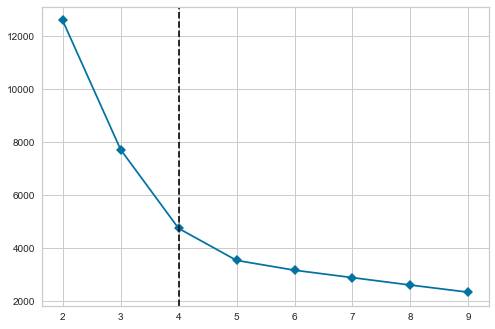

In [27]:
# plot elbow graph to find the best number of clusters
from yellowbrick.cluster import KElbowVisualizer

model = kmeans_pca
visualizer = KElbowVisualizer(model, k=(2,10), metric='distortion', timings=False)
visualizer.fit(projection)

In [28]:
projection['genres'] = dados_generos['genres']
projection.head()

,x,y,cluster_pca,genres
0,5.913028,-0.022724,0,21st century classical
1,2.808443,4.521474,0,432hz
2,-0.753649,-1.297757,1,8-bit
3,1.017765,-0.948860,4,[]
4,0.754944,-1.036759,4,a cappella


## Plotando a clustering

In [29]:
fig = px.scatter(
    projection, x='x',y='y',color='cluster_pca', hover_data=['x', 'y', 'cluster_pca', 'genres']
)
fig.show()

## Validando a divisão do cluster

In [30]:
explainability = pca_pipe[1].explained_variance_ratio_.sum()
print(f"o cluster está explicando {explainability * 100:.2f}% dos dados")

o cluster está explicando 41.87% dos dados


# Clusterização por música

## Redução de dimensionalidade com PCA

In [31]:
dados.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [32]:
dados['artists'].value_counts()

Drake                   170
Taylor Swift            156
Eminem                  147
Kanye West              136
BTS                     122
                       ... 
Of Monsters and Men       7
The Living Tombstone      7
Clean Bandit              7
Nelly Furtado             6
Empire of the Sun         6
Name: artists, Length: 875, dtype: int64

In [33]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(dtype=int)
colunas_ohe = ohe.fit_transform(dados[['artists']]).toarray()

dados2 = dados.drop('artists',axis=1)
# concat the table dados2 with colunas ohe
dados_musicas_dummies = pd.concat([dados2, pd.DataFrame(colunas_ohe,columns=ohe.get_feature_names_out(['artists']))], axis=1)
dados_musicas_dummies.head()

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0


In [34]:
print(dados.shape)
print(dados_musicas_dummies.shape)
print('{} colunas foram adicionadas'.format(dados_musicas_dummies.shape[1]-dados.shape[1]))

(20311, 16)
(20311, 890)
874 colunas foram adicionadas


In [35]:
pca_pipe2 = Pipeline([
   ('scaler', StandardScaler()),
   ('PCA', PCA(n_components=0.7, random_state=seed))
])
# quando passamos o valor float em n_components estamos especificando a taxa de aprendizado de 70% dos dados
music_embedding_pca = pca_pipe2.fit_transform(dados_musicas_dummies.drop(['id','name','artists_song'],axis=1))
projection_music = pd.DataFrame( data = music_embedding_pca)
# nao sabemos o numero de componentes necessarios para 70% de aprendizado, por isso, nao iremos especificar as colunas
pca_pipe2[1].n_components_

612

## Aplicação do cluster com K-Means

In [36]:
kmeans_pca_pipeline = KMeans(n_clusters=50, verbose=False, random_state=seed)
kmeans_pca_pipeline.fit(projection_music)

dados['cluster_pca'] = kmeans_pca_pipeline.predict(projection_music)
projection_music['cluster_pca'] = kmeans_pca_pipeline.predict(projection_music)

In [37]:
projection_music['artist'] = dados['artists']
projection_music['song'] = dados['artists_song']

In [38]:
projection_music.head(2)

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster_pca,artist,song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,-1.011328e-12,8.702118e-13,1.301007e-12,20,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,2.342492e-13,-1.809336e-12,-8.082819e-13,20,OutKast,OutKast - Ms. Jackson


##  Analisando o cluster

In [39]:
fig = px.scatter(
    projection_music, x=0, y=1,color='cluster_pca', hover_data=[0,1,'song']
)
# a ordem do PCA corresponde à ordem das colunas que melhor explicam os dados.
# Vamos visualizar o cluster a partir das colunas 0 e 1
fig.show()

In [40]:
# cluster in 3D
fig = px.scatter_3d(
    projection_music, x=0, y=1, z=2,color='cluster_pca', hover_data=[0,1,2,'song']
)
fig.update_traces(marker_size = 2)
fig.show()

In [41]:
print(pca_pipe2[1].explained_variance_ratio_.sum()*100,'taxa de aprendizado dos dados')

70.0000846318703 taxa de aprendizado dos dados


In [42]:
print(pca_pipe2[1].explained_variance_.sum(), "componentes explicados")

620.9313218688692 componentes explicados


# Sistemas de Recomendação

## Recomendação da música

In [43]:
nome_musica = 'Coldplay - Yellow'

In [68]:
from sklearn.metrics.pairwise import euclidean_distances

cluster = list(projection_music[projection_music['song']==nome_musica]['cluster_pca'])[0] # retorna o cluster da musica
musicas_recomendadas = projection_music[projection_music['cluster_pca']==cluster][[0,1,'song']] # retorna as musicas do mesmo cluster
x_musica = list(musicas_recomendadas[musicas_recomendadas['song']==nome_musica][0])[0] # retorna a coordenada x da musica
y_musica = list(musicas_recomendadas[musicas_recomendadas['song']==nome_musica][1])[0] # retorna a coordenada y da musica

# distancias euclidianas
distancias = euclidean_distances(musicas_recomendadas[[0,1]], [[x_musica,y_musica]])

musicas_recomendadas['id'] = dados['id']
musicas_recomendadas['distancia'] = distancias

recomendada = musicas_recomendadas.sort_values('distancia').head(10)
recomendada

,0,1,song,id,distancia
0,0.174796,0.731252,Coldplay - Yellow,3AJwUDP919kvQ9QcozQPxg,0.000000
3420,0.162624,0.736790,Los Bukis - Me Volví A Acordar De Ti,6n8Dl1KMjFoUIF9mzto4VP,0.013373
3546,0.193474,0.739328,Stevie Wonder - What Christmas Means To Me,0Cm9tD9xlYNCgW3UeHioq2,0.020350
278,0.149813,0.741217,Ying Yang Twins - Get Low,0r2Bul2NuCViraT2zX1l5j,0.026897
8293,0.148105,0.737046,Jay Chou - 夜曲,32nainF4TXsMpuFOGCkzzM,0.027312
7998,0.178488,0.691999,Los Bukis - Donde Estas,2zfeUz2xzgrtM2kF5bprCY,0.039426
17439,0.132422,0.711552,Jack Johnson - Cookie Jar,7jE5hACenHaqB8nTBrB0uL,0.046728
8234,0.167844,0.779954,Ricardo Arjona - Acompáñame a Estar Solo,6Eb3FQ2eSSyENY5wJsY0Ot,0.049197
12597,0.140635,0.770991,Avant - When It Hurts,00zqTWtvCWvDtAqoLRl6Sy,0.052404
4017,0.129582,0.701081,Los Inquietos Del Norte - Como Pez Sin Agua,5MTOEibo0lOLH4zqMgKHwk,0.054356


## Biblioteca Spotipy

**ATENÇÃO!**

Antes de rodar essa parte do código, você precisa fazer uma conta na API do Spotify e gerar suas próprias **client_id** e **client_secret**

In [76]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth
from spotipy.oauth2 import SpotifyClientCredentials

In [77]:
scope = 'user-library-read playlist-modify-private'
client_id = '33002e4a7c084338b10925dc2b8a9ef5'
client_secret = '42ce903b8a3c4d6a84c59e71571fe8a7'
redirect_uri = 'http://localhost:5000/callback'

Oauth = SpotifyOAuth(scope=scope, client_id=client_id, client_secret=client_secret, redirect_uri=redirect_uri)

In [78]:
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

## Imagem do álbum

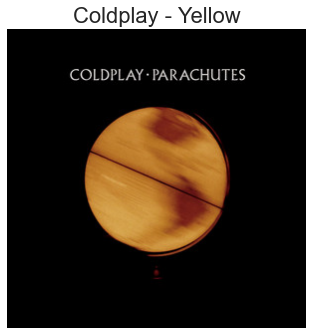

In [104]:
import matplotlib.pyplot as plt
from skimage import io
music_id = list(recomendada['id'])[0]
track = sp.track(music_id)
url = track['album']['images'][1]['url']
img = io.imread(url)
# show image without axis
plt.axis('off')
# plot artist name
plt.title(track['artists'][0]['name'] + ' - ' + track['name'], fontsize=22)
plt.imshow(img)

# Recomendador

## Gerando as imagens da playlist

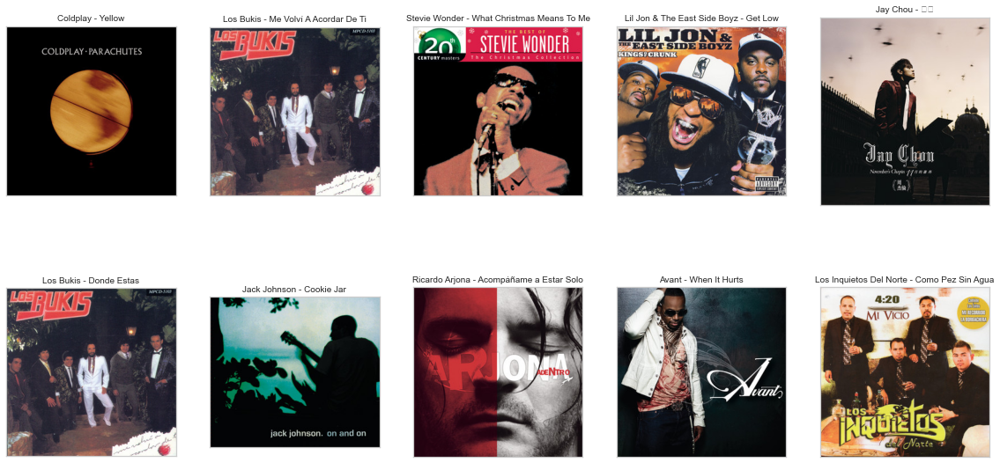

In [112]:
def recomended_id(play_list):
    # recebe uma lista de musicas
    # retorna uma lista de id's
    id_list = []
    for i in play_list:
        track = sp.track(i)
        id_list.append(track['id'])
    return id_list

def recomended_img(play_list):
    # recebe uma lista de musicas
    # retorna uma lista de imagens
    img_list = []
    for i in play_list:
        track = sp.track(i)
        url = track['album']['images'][1]['url']
        img = io.imread(url)
        img_list.append(img)
    return img_list

recomended_ids = recomended_id(list(recomendada['id']))
recomended_imgs = recomended_img(list(recomendada['id']))

# plot images
fig, ax = plt.subplots(2, 5, figsize=(20, 10))
for i, axi in enumerate(ax.flat):
    track = sp.track(recomended_ids[i])
    axi.imshow(recomended_imgs[i])
    axi.set(xticks=[], yticks=[])
    axi.set_title(track['artists'][0]['name'] + '-' + track['name'], fontsize=10)

## Fazendo uma função final

In [121]:
def recomendador(nome_musica):
    
    cluster = list(projection_music[projection_music['song']==nome_musica]['cluster_pca'])[0] # retorna o cluster da musica
    musicas_recomendadas = projection_music[projection_music['cluster_pca']==cluster][[0,1,'song']] # retorna as musicas do mesmo cluster
    x_musica = list(musicas_recomendadas[musicas_recomendadas['song']==nome_musica][0])[0] # retorna a coordenada x da musica
    y_musica = list(musicas_recomendadas[musicas_recomendadas['song']==nome_musica][1])[0] # retorna a coordenada y da musica
    # distancias euclidianas
    distancias = euclidean_distances(musicas_recomendadas[[0,1]], [[x_musica,y_musica]])
    musicas_recomendadas['id'] = dados['id']
    musicas_recomendadas['distancia'] = distancias
    recomendada = musicas_recomendadas.sort_values('distancia').head(10)
    
    recomended_ids = recomended_id(list(recomendada['id']))
    recomended_imgs = recomended_img(list(recomendada['id']))

    # plot images
    fig, ax = plt.subplots(2, 5, figsize=(20, 10))
    for i, axi in enumerate(ax.flat):
        track = sp.track(recomended_ids[i])
        axi.imshow(recomended_imgs[i])
        axi.set(xticks=[], yticks=[])
        axi.set_title(track['artists'][0]['name'] + '-' + track['name'], fontsize=10)
    return ax.flat

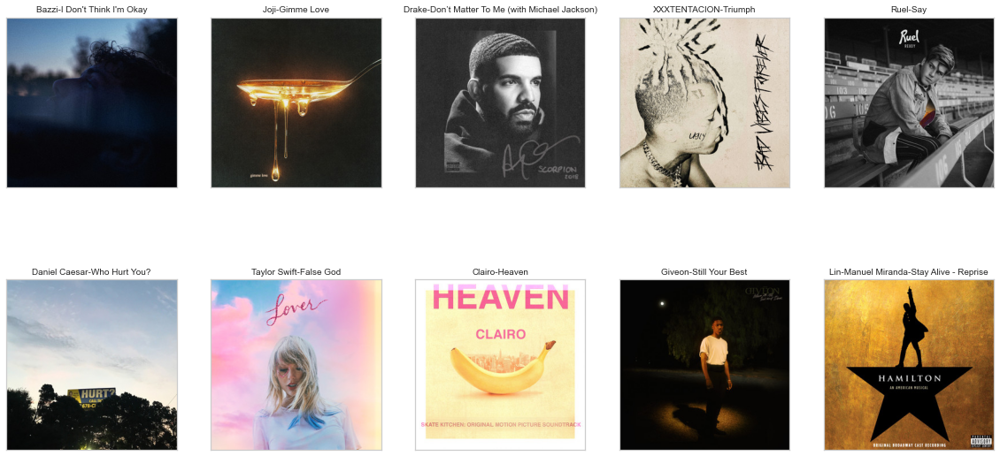

In [128]:
recomendador("Bazzi - I Don't Think I'm Okay")